<a href="https://colab.research.google.com/github/NathoC31/Challenge-Telecom-X-an-lisis-de-evasi-n-de-clientes/blob/main/TelecomX_LATAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#📌 Extracción

#Nathaly Cuasapaz

#Extracción de datos

✅ Cargar los datos directamente desde la API utilizando Python.


✅ Convertir los datos a un DataFrame de Pandas para facilitar su manipulación.

In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


import numpy as np
import requests
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import json

url = '/content/TelecomX_Data.json'
# Use json.load to read the local file
with open(url, 'r') as f:
    df = json.load(f)

datos = pd.json_normalize(df, sep='_')
df = pd.DataFrame(datos)

### Importar y manipular datos desde una API

In [ ]:
datos.head()

,customerID,Churn,customer_gender,customer_SeniorCitizen,customer_Partner,customer_Dependents,customer_tenure,phone_PhoneService,phone_MultipleLines,internet_InternetService,internet_OnlineSecurity,internet_OnlineBackup,internet_DeviceProtection,internet_TechSupport,internet_StreamingTV,internet_StreamingMovies,account_Contract,account_PaperlessBilling,account_PaymentMethod,account_Charges_Monthly,account_Charges_Total
0,0002-ORFBO,No,Female,0,Yes,Yes,9,Yes,No,DSL,No,Yes,No,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.3
1,0003-MKNFE,No,Male,0,No,No,9,Yes,Yes,DSL,No,No,No,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.4
2,0004-TLHLJ,Yes,Male,0,No,No,4,Yes,No,Fiber optic,No,No,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85
3,0011-IGKFF,Yes,Male,1,Yes,No,13,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85
4,0013-EXCHZ,Yes,Female,1,Yes,No,3,Yes,No,Fiber optic,No,No,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.4


#🔧 Transformación

### Explorar las columnas del dataset y tipos de datos

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7267 entries, 0 to 7266
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   customerID                 7267 non-null   object 
 1   Churn                      7267 non-null   object 
 2   customer_gender            7267 non-null   object 
 3   customer_SeniorCitizen     7267 non-null   int64  
 4   customer_Partner           7267 non-null   object 
 5   customer_Dependents        7267 non-null   object 
 6   customer_tenure            7267 non-null   int64  
 7   phone_PhoneService         7267 non-null   object 
 8   phone_MultipleLines        7267 non-null   object 
 9   internet_InternetService   7267 non-null   object 
 10  internet_OnlineSecurity    7267 non-null   object 
 11  internet_OnlineBackup      7267 non-null   object 
 12  internet_DeviceProtection  7267 non-null   object 
 13  internet_TechSupport       7267 non-null   objec

In [ ]:
datos.columns

Index(['customerID', 'Churn', 'customer_gender', 'customer_SeniorCitizen',
       'customer_Partner', 'customer_Dependents', 'customer_tenure',
       'phone_PhoneService', 'phone_MultipleLines', 'internet_InternetService',
       'internet_OnlineSecurity', 'internet_OnlineBackup',
       'internet_DeviceProtection', 'internet_TechSupport',
       'internet_StreamingTV', 'internet_StreamingMovies', 'account_Contract',
       'account_PaperlessBilling', 'account_PaymentMethod',
       'account_Charges_Monthly', 'account_Charges_Total'],
      dtype='object')

In [ ]:
df.describe()

,customer_SeniorCitizen,customer_tenure,account_Charges_Monthly
count,7267.000000,7267.000000,7267.000000
mean,0.162653,32.346498,64.720098
std,0.369074,24.571773,30.129572
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.425000
50%,0.000000,29.000000,70.300000
75%,0.000000,55.000000,89.875000
max,1.000000,72.000000,118.750000


In [ ]:
for col in df.columns:
    print(f"{col}: {df[col].nunique()} valores únicos")

customerID: 7267 valores únicos
Churn: 3 valores únicos
customer_gender: 2 valores únicos
customer_SeniorCitizen: 2 valores únicos
customer_Partner: 2 valores únicos
customer_Dependents: 2 valores únicos
customer_tenure: 73 valores únicos
phone_PhoneService: 2 valores únicos
phone_MultipleLines: 3 valores únicos
internet_InternetService: 3 valores únicos
internet_OnlineSecurity: 3 valores únicos
internet_OnlineBackup: 3 valores únicos
internet_DeviceProtection: 3 valores únicos
internet_TechSupport: 3 valores únicos
internet_StreamingTV: 3 valores únicos
internet_StreamingMovies: 3 valores únicos
account_Contract: 3 valores únicos
account_PaperlessBilling: 2 valores únicos
account_PaymentMethod: 4 valores únicos
account_Charges_Monthly: 1585 valores únicos
account_Charges_Total: 6531 valores únicos


###  Identificar columnas clave para el análisis de evasión

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


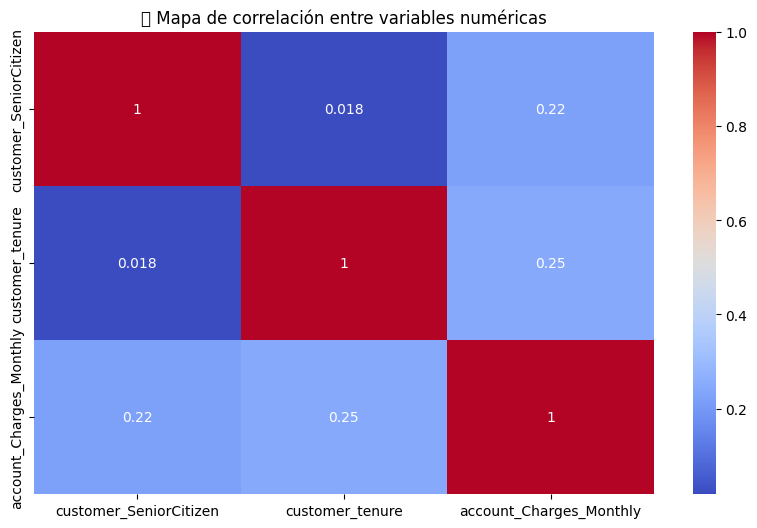

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionamos numéricas para ver correlación
df_num = df.select_dtypes(include='number')

# Mapa de calor de correlación
plt.figure(figsize=(10, 6))
sns.heatmap(df_num.corr(), annot=True, cmap='coolwarm')
plt.title("🔍 Mapa de correlación entre variables numéricas")
plt.show()


### Buscar valores nulos (ausentes)

In [ ]:
df.isnull()

,customerID,Churn,customer_gender,customer_SeniorCitizen,customer_Partner,customer_Dependents,customer_tenure,phone_PhoneService,phone_MultipleLines,internet_InternetService,internet_OnlineSecurity,internet_OnlineBackup,internet_DeviceProtection,internet_TechSupport,internet_StreamingTV,internet_StreamingMovies,account_Contract,account_PaperlessBilling,account_PaymentMethod,account_Charges_Monthly,account_Charges_Total
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
df.isnull().sum()

,0
customerID,0
Churn,0
customer_gender,0
customer_SeniorCitizen,0
customer_Partner,0
customer_Dependents,0
customer_tenure,0
phone_PhoneService,0
phone_MultipleLines,0
internet_InternetService,0


In [ ]:
df = df.fillna(0)
df.isnull().sum()

,0
customerID,0
Churn,0
customer_gender,0
customer_SeniorCitizen,0
customer_Partner,0
customer_Dependents,0
customer_tenure,0
phone_PhoneService,0
phone_MultipleLines,0
internet_InternetService,0


###  Buscar registros duplicados

In [ ]:
duplicados = df.duplicated()
print(f" Registros duplicados: {duplicados.sum()}")

df = df.drop_duplicates()


 Registros duplicados: 0


### Errores de formato o tipos de datos incorrectos

In [ ]:

print("\n📁 Tipos de datos:")
print(df.dtypes)



📁 Tipos de datos:
customerID                    object
Churn                         object
customer_gender               object
customer_SeniorCitizen         int64
customer_Partner              object
customer_Dependents           object
customer_tenure                int64
phone_PhoneService            object
phone_MultipleLines           object
internet_InternetService      object
internet_OnlineSecurity       object
internet_OnlineBackup         object
internet_DeviceProtection     object
internet_TechSupport          object
internet_StreamingTV          object
internet_StreamingMovies      object
account_Contract              object
account_PaperlessBilling      object
account_PaymentMethod         object
account_Charges_Monthly      float64
account_Charges_Total         object
dtype: object


In [ ]:
print(df.columns.tolist())


['customerID', 'Churn', 'customer_gender', 'customer_SeniorCitizen', 'customer_Partner', 'customer_Dependents', 'customer_tenure', 'phone_PhoneService', 'phone_MultipleLines', 'internet_InternetService', 'internet_OnlineSecurity', 'internet_OnlineBackup', 'internet_DeviceProtection', 'internet_TechSupport', 'internet_StreamingTV', 'internet_StreamingMovies', 'account_Contract', 'account_PaperlessBilling', 'account_PaymentMethod', 'account_Charges_Monthly', 'account_Charges_Total']


In [ ]:

df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
print(df.columns.tolist())


['customerid', 'churn', 'customer_gender', 'customer_seniorcitizen', 'customer_partner', 'customer_dependents', 'customer_tenure', 'phone_phoneservice', 'phone_multiplelines', 'internet_internetservice', 'internet_onlinesecurity', 'internet_onlinebackup', 'internet_deviceprotection', 'internet_techsupport', 'internet_streamingtv', 'internet_streamingmovies', 'account_contract', 'account_paperlessbilling', 'account_paymentmethod', 'account_charges_monthly', 'account_charges_total']


In [ ]:

df['account_charges_total'] = pd.to_numeric(df['account_charges_total'], errors='coerce')


### Inconsistencias en columnas categóricas

In [ ]:

columnas_categoricas = df.select_dtypes(include='object').columns

print("\n Revisión de categorías:")
for col in columnas_categoricas:
    print(f"{col}: {df[col].unique()}")



 Revisión de categorías:
customerid: ['0002-ORFBO' '0003-MKNFE' '0004-TLHLJ' ... '9992-UJOEL' '9993-LHIEB'
 '9995-HOTOH']
churn: ['No' 'Yes' '']
customer_gender: ['Female' 'Male']
customer_partner: ['Yes' 'No']
customer_dependents: ['Yes' 'No']
phone_phoneservice: ['Yes' 'No']
phone_multiplelines: ['No' 'Yes' 'No phone service']
internet_internetservice: ['DSL' 'Fiber optic' 'No']
internet_onlinesecurity: ['No' 'Yes' 'No internet service']
internet_onlinebackup: ['Yes' 'No' 'No internet service']
internet_deviceprotection: ['No' 'Yes' 'No internet service']
internet_techsupport: ['Yes' 'No' 'No internet service']
internet_streamingtv: ['Yes' 'No' 'No internet service']
internet_streamingmovies: ['No' 'Yes' 'No internet service']
account_contract: ['One year' 'Month-to-month' 'Two year']
account_paperlessbilling: ['Yes' 'No']
account_paymentmethod: ['Mailed check' 'Electronic check' 'Credit card (automatic)'
 'Bank transfer (automatic)']


In [ ]:
df = df[df['churn'] != '']

In [ ]:
print(df['churn'].value_counts(dropna=False))


churn
No     5174
Yes    1869
        224
Name: count, dtype: int64


In [ ]:

df['churn'] = df['churn'].replace('', pd.NA)

df = df.dropna(subset=['churn'])


In [ ]:
print(df.columns.tolist())


['customerid', 'churn', 'customer_gender', 'customer_seniorcitizen', 'customer_partner', 'customer_dependents', 'customer_tenure', 'phone_phoneservice', 'phone_multiplelines', 'internet_internetservice', 'internet_onlinesecurity', 'internet_onlinebackup', 'internet_deviceprotection', 'internet_techsupport', 'internet_streamingtv', 'internet_streamingmovies', 'account_contract', 'account_paperlessbilling', 'account_paymentmethod', 'account_charges_monthly', 'account_charges_total']


In [ ]:
columnas_internet = [
    'internet_onlinesecurity', 'internet_onlinebackup',
    'internet_deviceprotection', 'internet_techsupport',
    'internet_streamingtv', 'internet_streamingmovies'
]

for col in columnas_internet:
    df[col] = df[col].replace('No internet service', 'No')


In [ ]:
df['phone_multiplelines'] = df['phone_multiplelines'].replace('No phone service', 'No')


In [ ]:
df['account_paymentmethod'] = df['account_paymentmethod'].str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')


In [ ]:
df['account_contract'] = df['account_contract'].str.lower().str.replace(' ', '_')


In [ ]:
df['customer_gender'] = df['customer_gender'].astype(str).replace({'Male': 1, 'Female': 0}).astype(int)


In [ ]:
cat_cols = df.select_dtypes(include='object').columns

for col in cat_cols:
    df[col] = df[col].astype('category')


### Confirmación final del estado del dataset

In [ ]:
print("\n✅ Estado final de limpieza:")
print(df.info())



✅ Estado final de limpieza:
<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 0 to 7266
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   customerid                 7043 non-null   category
 1   churn                      7043 non-null   category
 2   customer_gender            7043 non-null   category
 3   customer_seniorcitizen     7043 non-null   int64   
 4   customer_partner           7043 non-null   category
 5   customer_dependents        7043 non-null   category
 6   customer_tenure            7043 non-null   int64   
 7   phone_phoneservice         7043 non-null   category
 8   phone_multiplelines        7043 non-null   category
 9   internet_internetservice   7043 non-null   category
 10  internet_onlinesecurity    7043 non-null   category
 11  internet_onlinebackup      7043 non-null   category
 12  internet_deviceprotection  7043 non-null   category
 13  internet_

In [ ]:
df = df.dropna(subset=['account_charges_total'])


In [ ]:
print(df['churn'].value_counts())



churn
No     5163
Yes    1869
Name: count, dtype: int64


In [ ]:
for col in df.select_dtypes(include='category').columns:
    print(f"\n{col}:")
    print(df[col].value_counts())


Streaming output truncated to the last 5000 lines.
3096-GKWEB    1
3094-JOJAI    1
3092-IGHWF    1
3091-FYHKI    1
3090-QFUVD    1
3090-LETTY    1
3090-HAWSU    1
3088-LHEFH    1
3088-FVYWK    1
3086-RUCRN    1
3085-QUOZK    1
3084-DOWLE    1
3082-YVEKW    1
3082-WQRVY    1
3082-VQXNH    1
3118-UHVVQ    1
3115-JPJDD    1
3113-IWHLC    1
3108-PCCGG    1
3106-ULWFW    1
3104-OWCGK    1
3099-OONVS    1
3097-PYWXL    1
3097-NQYSN    1
3097-NNSPB    1
3097-IDVPU    1
3097-FQTVJ    1
3096-YXENJ    1
3096-WPXBT    1
3096-JRDSO    1
3144-AUDBS    1
3143-JQEGI    1
3143-ILDAL    1
3138-BKYAV    1
3137-NYQQI    1
3137-LUPIX    1
3134-DSHVC    1
3133-PZNSR    1
3132-TVFDZ    1
3131-NWVFJ    1
3130-ICDUP    1
3129-AAQOU    1
3128-YOVTD    1
3126-WQMGH    1
3125-RAHBV    1
3120-FAZKD    1
3164-YAXFY    1
3164-AALRN    1
3162-ZJZFU    1
3162-KKZXO    1
3161-ONRWK    1
3161-GETRM    1
3160-TYXLT    1
3158-MOERK    1
3156-QLHBO    1
3154-HMWUU    1
3154-CFSZG    1
3148-BLQJT    1
3148-AOIQT    1
3146-

In [ ]:
df.reset_index(drop=True, inplace=True)


### Paso para crear la columna cuentas_diarias

In [ ]:
df.loc[:, 'cuentas_diarias'] = df['account_charges_monthly'] / 30


In [ ]:
df = df[df['churn'] != ''].copy()


In [ ]:
df['cuentas_diarias'] = df['account_charges_monthly'] / 30

print(df[['account_charges_monthly', 'cuentas_diarias']].head())



   account_charges_monthly  cuentas_diarias
0                     65.6         2.186667
1                     59.9         1.996667
2                     73.9         2.463333
3                     98.0         3.266667
4                     83.9         2.796667


In [ ]:
df['cuentas_diarias'] = df['cuentas_diarias'].round(2)

In [ ]:
print(df.columns.tolist())


['customerid', 'churn', 'customer_gender', 'customer_seniorcitizen', 'customer_partner', 'customer_dependents', 'customer_tenure', 'phone_phoneservice', 'phone_multiplelines', 'internet_internetservice', 'internet_onlinesecurity', 'internet_onlinebackup', 'internet_deviceprotection', 'internet_techsupport', 'internet_streamingtv', 'internet_streamingmovies', 'account_contract', 'account_paperlessbilling', 'account_paymentmethod', 'account_charges_monthly', 'account_charges_total', 'cuentas_diarias']


### Transformar valores categóricos “Sí” / “No” en binarios (1 / 0)

In [ ]:
cols_binarias = [
    'churn', 'customer_partner', 'customer_dependents',
    'phone_phoneservice', 'phone_multiplelines',
    'internet_onlinesecurity', 'internet_onlinebackup',
    'internet_deviceprotection', 'internet_techsupport',
    'internet_streamingtv', 'internet_streamingmovies',
    'account_paperlessbilling'
]


In [ ]:
cols_binarias = [
    'churn', 'tiene_pareja', 'tiene_dependientes',
    ...
]


In [ ]:
for col in cols_binarias:
    if col in df.columns:
        df[col] = df[col].astype(str).replace({'Yes': 1, 'No': 0}).astype(int)
    else:
        print(f"⚠️ Columna no encontrada: {col}")


⚠️ Columna no encontrada: tiene_pareja
⚠️ Columna no encontrada: tiene_dependientes
⚠️ Columna no encontrada: Ellipsis


In [ ]:
for col in cols_binarias:
    if col in df.columns:
        df[col] = df[col].astype('object')
        df[col] = df[col].replace({'Yes': 1, 'No': 0}).astype(int)
    else:
        print(f"⚠️ Columna no encontrada: {col}")


⚠️ Columna no encontrada: customer_partner
⚠️ Columna no encontrada: customer_dependents
⚠️ Columna no encontrada: phone_phoneservice
⚠️ Columna no encontrada: phone_multiplelines
⚠️ Columna no encontrada: internet_onlinesecurity
⚠️ Columna no encontrada: internet_onlinebackup
⚠️ Columna no encontrada: internet_deviceprotection
⚠️ Columna no encontrada: internet_techsupport
⚠️ Columna no encontrada: internet_streamingtv
⚠️ Columna no encontrada: internet_streamingmovies
⚠️ Columna no encontrada: account_paperlessbilling


/tmp/ipython-input-1741200733.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].replace({'Yes': 1, 'No': 0}).astype(int)


In [ ]:
df.rename(columns={
    'customer_gender': 'genero',
    'customer_seniorcitizen': 'adulto_mayor',
    'customer_partner': 'tiene_pareja',
    'customer_dependents': 'tiene_dependientes',
    'customer_tenure': 'antiguedad_meses',
    'phone_phoneservice': 'tiene_telefono',
    'phone_multiplelines': 'tiene_varias_lineas',
    'internet_internetservice': 'tipo_internet',
    'internet_onlinesecurity': 'seguridad_en_linea',
    'internet_onlinebackup': 'respaldo_en_linea',
    'internet_deviceprotection': 'proteccion_dispositivo',
    'internet_techsupport': 'soporte_tecnico',
    'internet_streamingtv': 'streaming_tv',
    'internet_streamingmovies': 'streaming_peliculas',
    'account_contract': 'tipo_contrato',
    'account_paperlessbilling': 'factura_electronica',
    'account_paymentmethod': 'metodo_pago',
    'account_charges_monthly': 'cargo_mensual',
    'account_charges_total': 'cargo_total',
    'cuentas_diarias': 'cargo_diario'
}, inplace=True)


In [ ]:
df['genero'] = df['genero'].astype(str).replace({'Male': 1, 'Female': 0}).astype(int)




In [ ]:
print(df.head())
print(df.dtypes)


   customerid  churn  genero  adulto_mayor  tiene_pareja  tiene_dependientes  \
0  0002-ORFBO      0       0             0             1                   1   
1  0003-MKNFE      0       1             0             0                   0   
2  0004-TLHLJ      1       1             0             0                   0   
3  0011-IGKFF      1       1             1             1                   0   
4  0013-EXCHZ      1       0             1             1                   0   

   antiguedad_meses  tiene_telefono  tiene_varias_lineas tipo_internet  \
0                 9               1                    0           DSL   
1                 9               1                    1           DSL   
2                 4               1                    0   Fiber optic   
3                13               1                    0   Fiber optic   
4                 3               1                    0   Fiber optic   

   seguridad_en_linea  respaldo_en_linea  proteccion_dispositivo  \
0     

#Carga y análisis

## Análisis Descriptivo


### Análisis general de columnas numéricas

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
churn,7032.0,0.265785,0.441782,0.00,0.0000,0.000,1.0000,1.00
genero,7032.0,0.504693,0.500014,0.00,0.0000,1.000,1.0000,1.00
adulto_mayor,7032.0,0.162400,0.368844,0.00,0.0000,0.000,0.0000,1.00
tiene_pareja,7032.0,0.482509,0.499729,0.00,0.0000,0.000,1.0000,1.00
tiene_dependientes,7032.0,0.298493,0.457629,0.00,0.0000,0.000,1.0000,1.00
antiguedad_meses,7032.0,32.421786,24.545260,1.00,9.0000,29.000,55.0000,72.00
tiene_telefono,7032.0,0.903299,0.295571,0.00,1.0000,1.000,1.0000,1.00
tiene_varias_lineas,7032.0,0.421928,0.493902,0.00,0.0000,0.000,1.0000,1.00
seguridad_en_linea,7032.0,0.286547,0.452180,0.00,0.0000,0.000,1.0000,1.00
respaldo_en_linea,7032.0,0.344852,0.475354,0.00,0.0000,0.000,1.0000,1.00


### Análisis personalizado (media, mediana, desviación, etc.)

In [ ]:
import numpy as np

columnas_numericas = [
    'antiguedad_meses',
    'cargo_mensual',
    'cargo_total',
    'cargo_diario'
]

for col in columnas_numericas:
    print(f"\n📊 Estadísticas para: {col}")
    print(f"Media: {df[col].mean():.2f}")
    print(f"Mediana: {df[col].median():.2f}")
    print(f"Desviación estándar: {df[col].std():.2f}")
    print(f"Mínimo: {df[col].min():.2f}")
    print(f"Máximo: {df[col].max():.2f}")
    print(f"Coeficiente de variación: {(df[col].std() / df[col].mean()):.2%}")


📊 Estadísticas para: antiguedad_meses
Media: 32.42
Mediana: 29.00
Desviación estándar: 24.55
Mínimo: 1.00
Máximo: 72.00
Coeficiente de variación: 75.71%

📊 Estadísticas para: cargo_mensual
Media: 64.80
Mediana: 70.35
Desviación estándar: 30.09
Mínimo: 18.25
Máximo: 118.75
Coeficiente de variación: 46.43%

📊 Estadísticas para: cargo_total
Media: 2283.30
Mediana: 1397.47
Desviación estándar: 2266.77
Mínimo: 18.80
Máximo: 8684.80
Coeficiente de variación: 99.28%

📊 Estadísticas para: cargo_diario
Media: 2.16
Mediana: 2.34
Desviación estándar: 1.00
Mínimo: 0.61
Máximo: 3.96
Coeficiente de variación: 46.44%


### Distribución de churn

In [ ]:
print("📉 Distribución de churn:")
print(df['churn'].value_counts())
print("\n% de churn:")
print(df['churn'].value_counts(normalize=True) * 100)


📉 Distribución de churn:
churn
0    5163
1    1869
Name: count, dtype: int64

% de churn:
churn
0    73.421502
1    26.578498
Name: proportion, dtype: float64


### Agrupaciones útiles

In [ ]:
df.groupby('churn')[['cargo_total', 'cargo_diario']].mean()


,cargo_total,cargo_diario
churn,,
0,2555.344141,2.043486
1,1531.796094,2.481450


## Distribución de evasión

### Gráfico de barras muestra el conteo total de clientes que se quedaron (No) y los que se fueron (Yes).

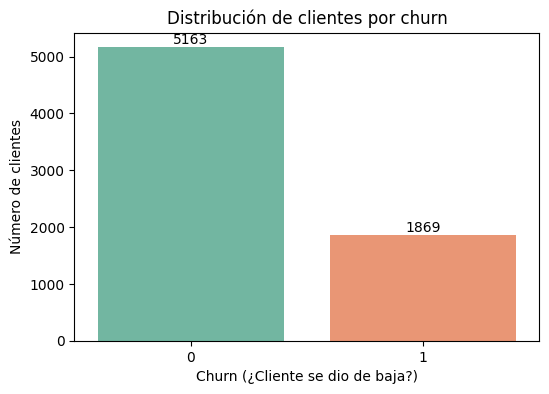

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

df['churn'] = df['churn'].astype(str)

#  1. Gráfico de barras
plt.figure(figsize=(6, 4))
ax = sns.countplot(data=df, x='churn', hue='churn', dodge=False, palette='Set2', legend=False)
plt.title('Distribución de clientes por churn')
plt.xlabel('Churn (¿Cliente se dio de baja?)')
plt.ylabel('Número de clientes')

for container in ax.containers:
    ax.bar_label(container)

plt.show()




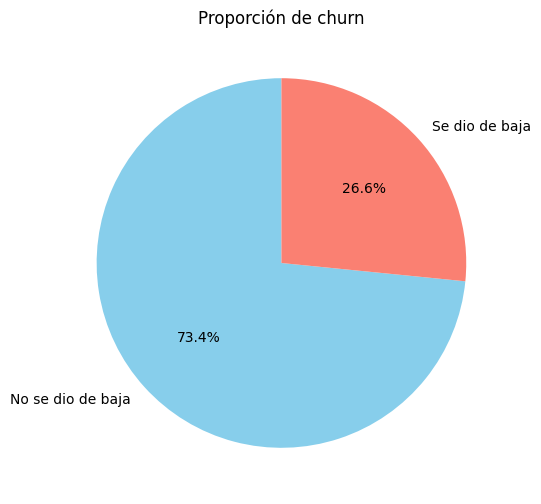

In [ ]:
# 2. Gráfico de pastel

plt.figure(figsize=(6,6))
df['churn'].value_counts().plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    colors=['skyblue','salmon'],
    labels=['No se dio de baja', 'Se dio de baja']
)
plt.title('Proporción de churn')
plt.ylabel('')
plt.show()

## Recuento de evasión por variables categóricas

### Evasión según género

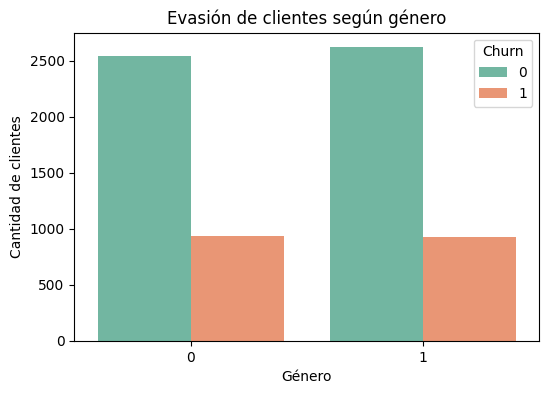

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Evasión por género
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='genero', hue='churn', palette='Set2')
plt.title('Evasión de clientes según género')
plt.xlabel('Género')
plt.ylabel('Cantidad de clientes')
plt.legend(title='Churn')
plt.show()

###  Evasión según tipo de contrato

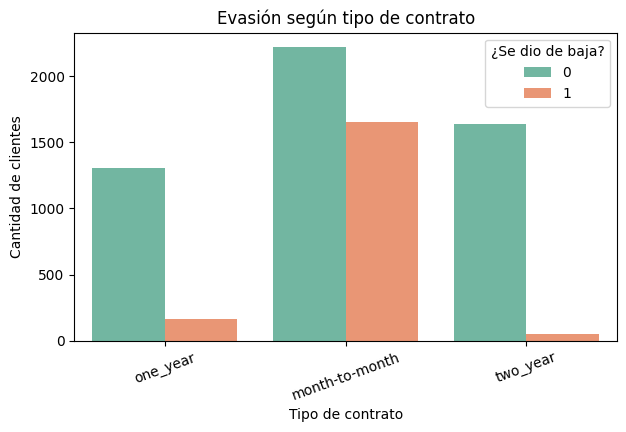

In [ ]:
plt.figure(figsize=(7, 4))
sns.countplot(data=df, x='tipo_contrato', hue='churn', palette='Set2')
plt.title('Evasión según tipo de contrato')
plt.xlabel('Tipo de contrato')
plt.ylabel('Cantidad de clientes')
plt.legend(title='¿Se dio de baja?')
plt.xticks(rotation=20)
plt.show()



### Evasión según método de pago

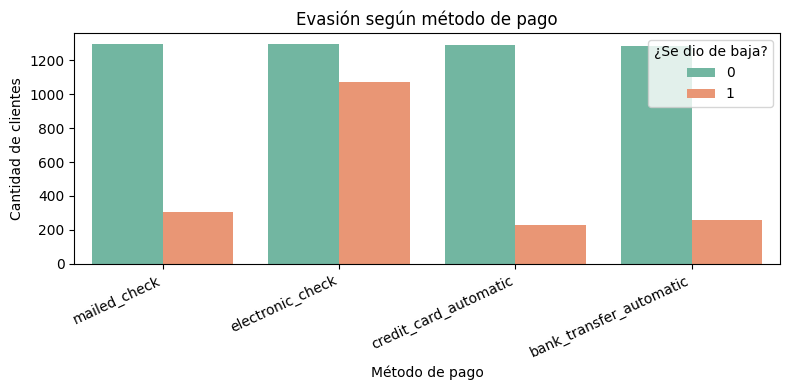

In [ ]:
plt.figure(figsize=(8, 4))
sns.countplot(data=df, x='metodo_pago', hue='churn', palette='Set2')
plt.title('Evasión según método de pago')
plt.xlabel('Método de pago')
plt.ylabel('Cantidad de clientes')
plt.legend(title='¿Se dio de baja?')
plt.xticks(rotation=25, ha='right')
plt.tight_layout()
plt.show()


### Gráfico repetido para otras variables relevantes

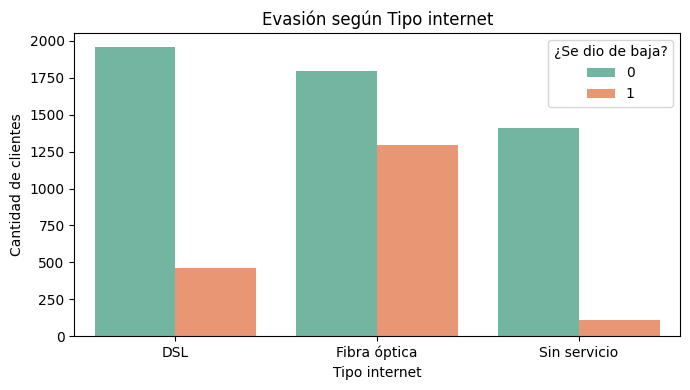

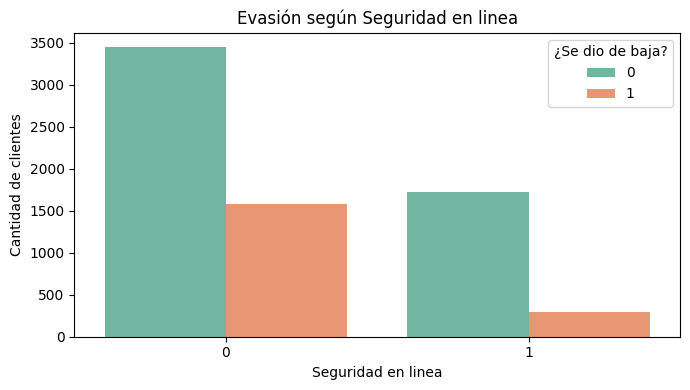

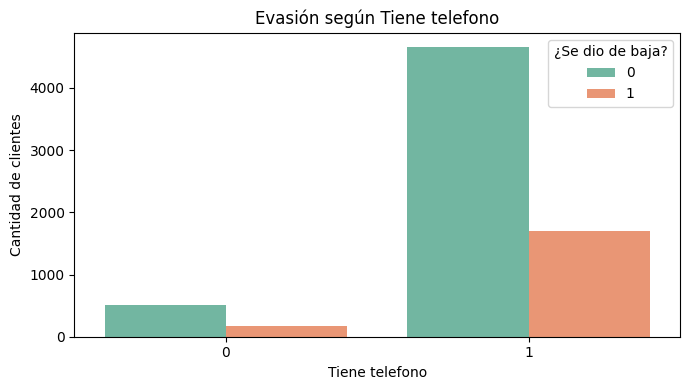

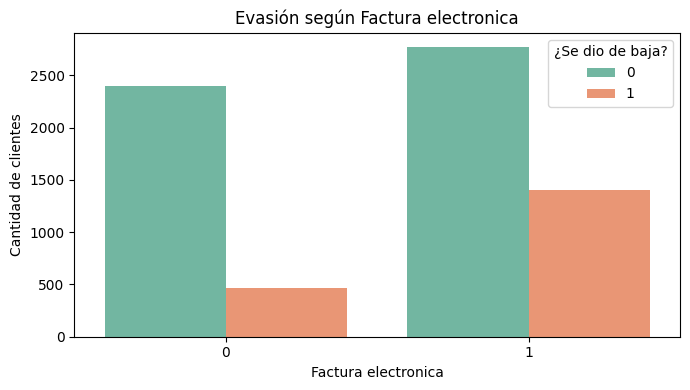

In [ ]:
variables = [
    'tipo_internet',
    'seguridad_en_linea',
    'tiene_telefono',
    'factura_electronica'
]

for var in variables:
    plt.figure(figsize=(7, 4))
    sns.countplot(data=df, x=var, hue='churn', palette='Set2')
    plt.title(f'Evasión según {var.replace("_", " ").capitalize()}')
    plt.xlabel(var.replace("_", " ").capitalize())
    plt.ylabel('Cantidad de clientes')
    plt.legend(title='¿Se dio de baja?')
    plt.tight_layout()
    plt.show()


## Conteo de evasión por variables numéricas

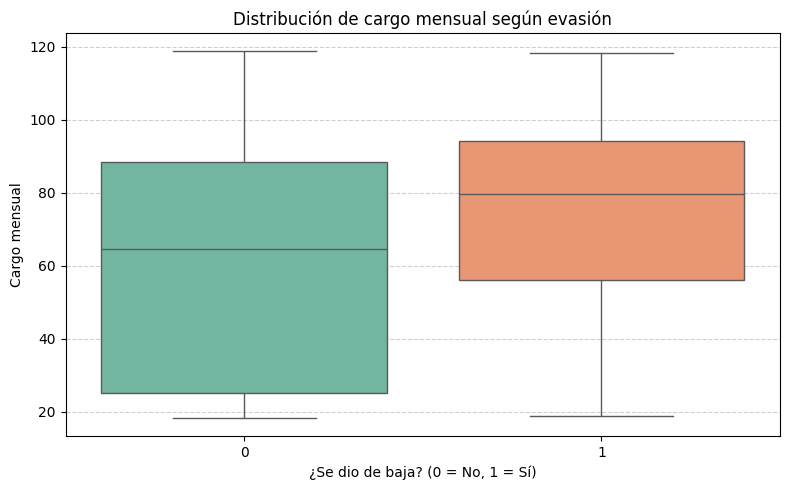

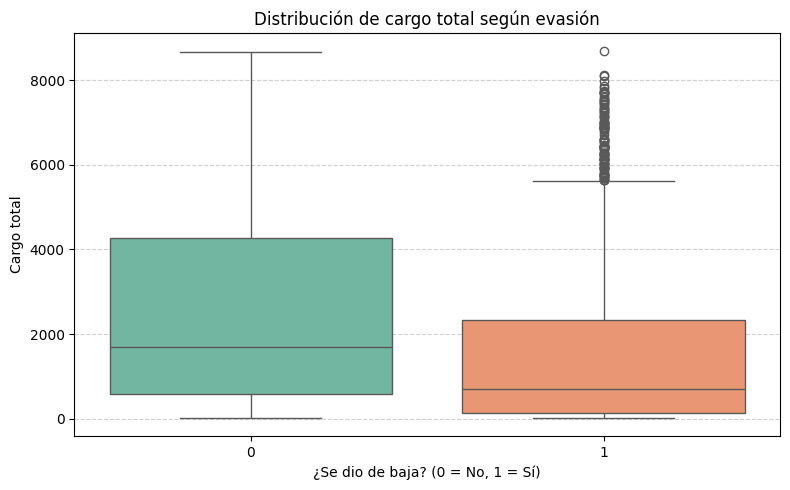

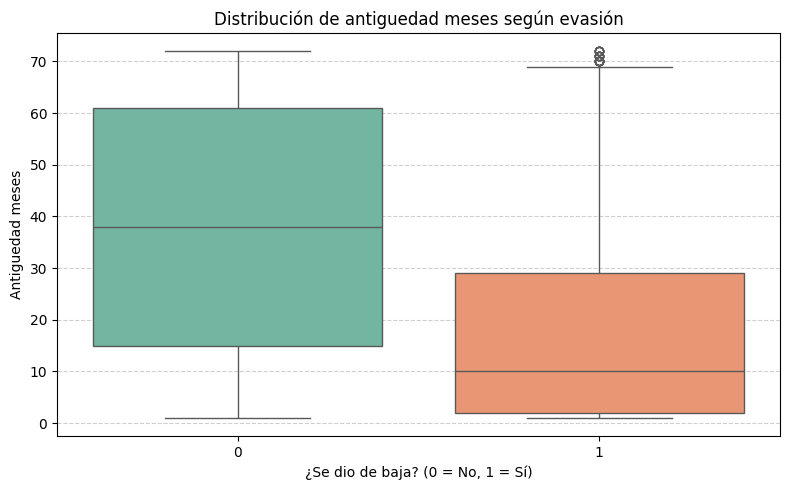

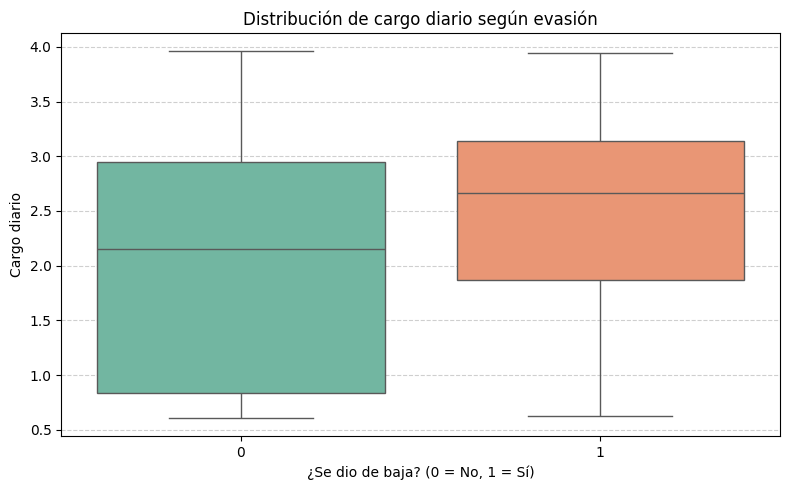

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

df['churn'] = df['churn'].astype(str)

variables_numericas = ['cargo_mensual', 'cargo_total', 'antiguedad_meses', 'cargo_diario']

for var in variables_numericas:
    plt.figure(figsize=(8, 5))
    sns.boxplot(data=df, x='churn', y=var, hue='churn', palette='Set2', legend=False, dodge=False)
    plt.title(f'Distribución de {var.replace("_", " ")} según evasión')
    plt.xlabel('¿Se dio de baja? (0 = No, 1 = Sí)')
    plt.ylabel(var.replace("_", " ").capitalize())
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()



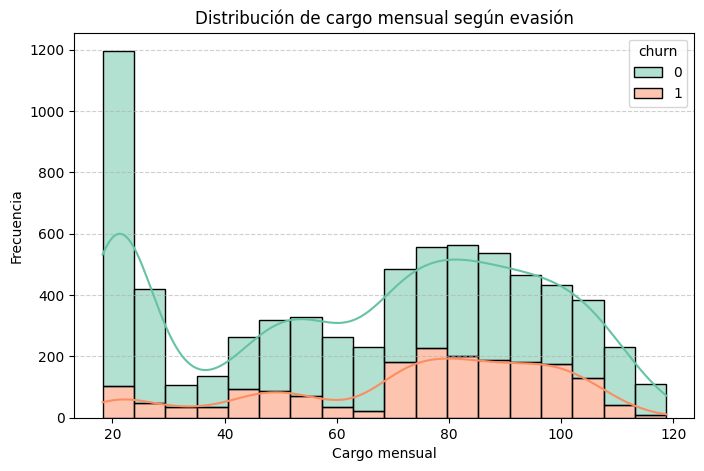

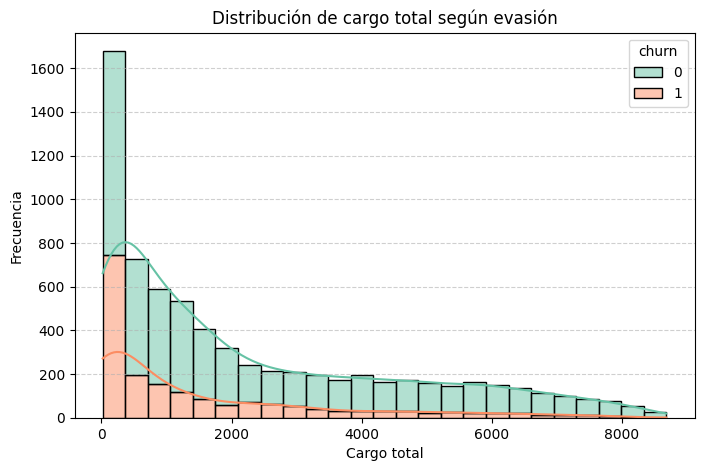

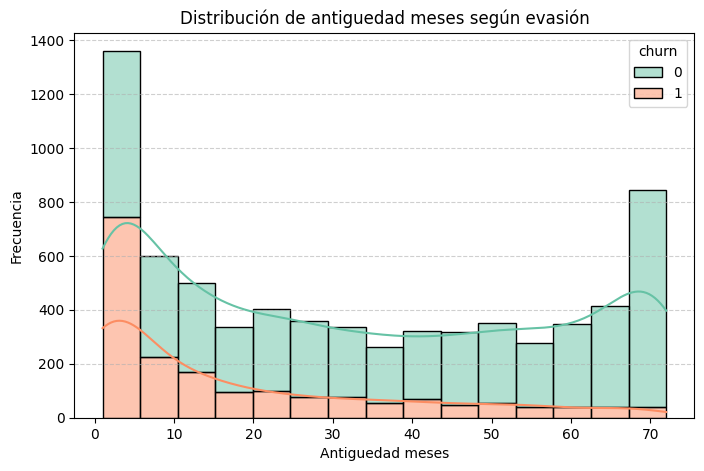

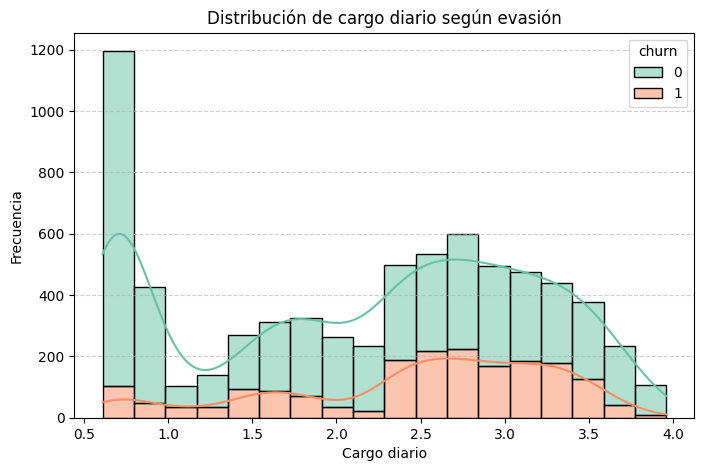

In [ ]:
for var in variables_numericas:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=df, x=var, hue='churn', kde=True, multiple='stack', palette='Set2')
    plt.title(f'Distribución de {var.replace("_", " ")} según evasión')
    plt.xlabel(var.replace("_", " ").capitalize())
    plt.ylabel('Frecuencia')
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.show()


#📄Informe final